# Setup

In [1]:
# There was an issue when importing umap. This was due to tensorflow issue when importing tf. This was because tensorlow-macos was updated but not tensorflow-metal. So make sure to update both when updating tensorflow, and this fixed the isue.
import tensorflow

In [2]:
import scanpy as sc
import umap
reducer = umap.UMAP()
import cellhint
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import anndata as ad

In [3]:
# Set up output figure settings
plt.rcParams['figure.figsize']=(64,64) #rescale figures, increase sizehere

# Set up scanpy settings
sc.settings.verbosity = 3
sc.set_figure_params(dpi=100, dpi_save=300) #Increase DPI for better resolution figures
#sc.logging.print_versions()

# Load/save anndata object

In [4]:
# Load the Malawi cohort - only covid cases
adata_Malawi = ad.read_h5ad('./2_h5ad files/adata_COVID') #only covid cases included

In [5]:
adata_Malawi.obs['Group']

2358      COVID-19
2359      COVID-19
2360      COVID-19
2361      COVID-19
2362      COVID-19
            ...   
184074    COVID-19
184075    COVID-19
184076    COVID-19
184077    COVID-19
184078    COVID-19
Name: Group, Length: 53762, dtype: category
Categories (1, object): ['COVID-19']

In [6]:
# Load the Brazilian cohort - only covid cases
adata_Brazil = ad.read_h5ad('./8_h5ad_files_Brazil_cohort/adata_subset4.h5ad') #only covid cases

In [7]:
adata_Brazil.obs['Type']

0          Late death
1          Late death
3          Late death
5          Late death
6          Late death
             ...     
231168    Early death
231169    Early death
231171    Early death
231173    Early death
231175    Early death
Name: Type, Length: 77314, dtype: category
Categories (2, object): ['Early death', 'Late death']

In [8]:
# Load the US cohort - only covid cases
adata_US = ad.read_h5ad('./7_h5ad_files_US_cohort/adata_covid') #only covid cases

In [9]:
adata_US.obs['Type']

1         Early death
5         Early death
6         Early death
9         Early death
10        Early death
             ...     
285083     Late death
285084     Late death
285086     Late death
285087     Late death
285088     Late death
Name: Type, Length: 129873, dtype: category
Categories (2, object): ['Early death', 'Late death']

In [10]:
#Add the cohort info as a column in .obs

adata_Malawi.obs["Cohort"] = "Malawi"
adata_Brazil.obs["Cohort"] = "Brazil"
adata_US.obs["Cohort"] = "US"


# Concatenate adatas

In [11]:
adata_list = adata_Malawi, adata_Brazil, adata_US

In [12]:
adata = ad.concat(adata_list, join="inner")

/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/anndata/_core/merge.py:217: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(dtype):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [13]:
adata

AnnData object with n_obs × n_vars = 260949 × 17
    obs: 'Master_Index', 'ROI', 'X_loc', 'Y_loc', 'cell_type', 'hierarchy', 'pheno_cluster', 'Cohort'
    obsm: 'X_umap', 'spatial'

# 1- Harmonisation

In [14]:
# Log-normalised gene expression (to 10,000 counts per cell) is in .X, and raw counts are in .raw. 
# CellHint does not rely on the latter, but here we still start from raw counts for completeness of a single-cell pipeline.
adata.X

array([[0.9384088 , 0.23811804, 0.32957447, ..., 0.00922035, 0.10238127,
        0.2406305 ],
       [0.29142836, 0.0702593 , 0.6066746 , ..., 0.04963042, 0.00947968,
        0.68355453],
       [0.62532765, 0.23591806, 0.3000204 , ..., 0.02774869, 0.20510665,
        0.49501082],
       ...,
       [0.        , 0.08592635, 0.5112977 , ..., 0.05217135, 0.08138941,
        0.        ],
       [0.07484418, 0.05922211, 0.05435635, ..., 0.00840387, 0.16111678,
        0.05774622],
       [0.23889154, 0.15446796, 0.58853865, ..., 0.01749498, 0.2690504 ,
        0.02997967]], dtype=float32)

In [15]:
# Perform a canonical single-cell workflow from normalisation, highly variable genes (HVGs) identification, 
# scaling, PCA, neighborhood construction to low-dimensional visualisation.

# Here the IMC is already normalised, so skip these steps.

#sc.pp.normalize_total(adata, target_sum = 1e4)
#sc.pp.log1p(adata)
#sc.pp.highly_variable_genes(adata, batch_key = 'Cohort', subset = True)
#sc.pp.scale(adata, max_value = 10)
sc.tl.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)

computing PCA
    with n_comps=16
    finished (0:00:00)
computing neighbors
    using data matrix X directly


/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:51)


... storing 'Cohort' as categorical
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


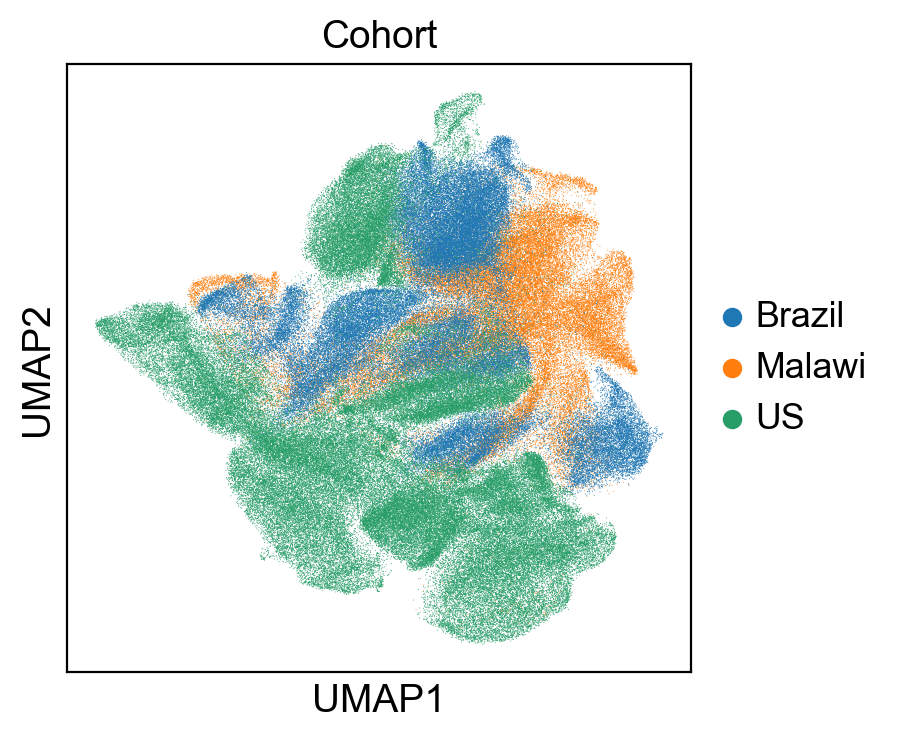

In [16]:
# Unintegrated UMAP

sc.pl.umap(adata, color = 'Cohort')

In [ ]:
# Original cell annotation
sc.pl.umap(adata, color = 'pheno_cluster')

# 1.1- Perform cell type harmonisation

The input AnnData needs two columns in .obs representing dataset origin and cell original annotation, respectively. We will use the function cellhint.harmonize to harmonise cell types across datasets.

By default, PCA (X_pca) is used as the search space, which is noisy as the batch effect is not corrected. However, this is usually not a problem for cellhint.harmonize due to an internal normalisation procedure applied. Please provide a different latent representation via the argument use_rep if you do have a better choice.

If a very strong batch effect exists across datasets, you can turn on ``use_pct = True`` (default to ``False``) to predict instead of calculate these distances in the space.

In CellHint, datasets are iteratively incorporated and harmonised. The order of datasets can be specified by providing a list of dataset names to the argument dataset_order. Otherwise, the order will be determined by CellHint through iteratively adding a dataset that is most similar (i.e., more shared cell types) to the datasets already incorporated. This behaviour can be disabled by setting reorder_dataset = False (default to True) and an alphabetical order of datasets will be used.

Through this parameter, a predictive clustering tree (PCT) is built for each dataset, and distances between cells in query datasets and cell types in the reference dataset are predicted, often resulting in unbiased distance measures.

Due to the nonparametric nature of PCT, the format of the expression .X in the AnnData is flexible (normalised, log-normalised, z-scaled, etc.), but subsetting the AnnData to highly variable genes is always suggested. To avoid overfitting, each PCT is pruned at nodes where no further splits are needed based on F-test, which is turned on by default (F_test_prune = True). You can increase the p-value cutoff (default to 0.05, p_thres = 0.05) to prune fewer nodes for improved accuracy at the cost of reduced generalisability.

In [ ]:
alignment = cellhint.harmonize(adata, 'Cohort', 'pheno_cluster')

In [ ]:
alignment2 = cellhint.harmonize(adata, 'Cohort', 'pheno_cluster', dataset_order = ["Brazil", "Malawi", "US"])

In [ ]:
alignment3 = cellhint.harmonize(adata, 'Cohort', 'pheno_cluster', dataset_order = ["Malawi", "Brazil", "US"])

In [ ]:
# Check the summary information.
alignment

In [ ]:
alignment2

In [ ]:
# Save the harmonisation result as a .pkl file.

alignment.write('./cohorts_alignment_no_pct.pkl')
alignment2.write('./cohorts_alignment_order_Brazil_Malawi_US.pkl')

In [17]:
alignment = cellhint.DistanceAlignment.load('./6_Analysis/15_CellHint/cohorts_alignment_no_pct.pkl')
alignment2 = cellhint.DistanceAlignment.load('./6_Analysis/15_CellHint/cohorts_alignment_order_Brazil_Malawi_US.pkl')

# 1.2- Inspect the harmonisation result

In [ ]:
alignment = cellhint.DistanceAlignment.load('./cohorts_alignment_no_pct.pkl')

1. Harmonisation table

In alignment, the harmonisation table, which summarises cell types across datasets into semantically connected ones, is stored as the attribute .relation.

The table columns are the dataset1 name, relation, dataset2 name, …, all the way to the name of the last dataset. Accordingly, each row of the table is a list of cell types connected by predefined symbols of =, ∈, and ∋. In addition to cell type names, there are two extra definitions of NONE and UNRESOLVED in the table, representing two levels of novelties.

The table should be interpreted from left to right. For example, for the first row A = B = C, although it may look like an 1:1 match between A and B plus an 1:1 match between B and C, a correct interpretation should be an 1:1 match between A and B, resulting in a meta cell type of A = B. This meta cell type, as a whole, has an 1:1 match with C, further leading to A = B = C. Similarly, for the second row D = NONE = UNRESOLVED, instead of a novel cell type D in dataset1, this cell type should be read as a dataset1-specific cell type not existing in dataset2 (D = NONE), which as a whole is unharmonised when aligning with dataset3 (D = NONE = UNRESOLVED).

Extending this interpretation to the third and fourth rows, they denote two cell types (E and F) in dataset1 collectively constituting the cell type G in dataset2. The resulting subtypes (E ∈ G and F ∈ G) are 1:1 matched with H and I in dataset3, respectively. For the last two rows, they describe the subdivision of a meta cell type (J = K) into L and M in dataset3, being more than a subdivision of K.

In the table, each row corresponds to a harmonised low-hierarchy cell type, in other words, the most fine-grained level of annotation that can be achieved by automatic alignment. At a high hierarchy, some cell types such as E ∈ G = H and F ∈ G = I belong to the same group. CellHint defines a high-hierarchy cell type as fully connected rows in the harmonisation table. As a result, each high-hierarchy cell type is a cell type group independent of each other. This information can be accessed in the attribute .groups which is an array/vector with an length of the number of rows in the harmonisation table.

In [ ]:
# Note - `alignment.relation` is simply a Pandas data frame.
# Show the top 10 rows of the table.
alignment.relation.head(50)

In [ ]:
alignment2.relation.head(50)

In [ ]:
alignment3.relation.head(50)

Show the cell type groups (high-hierarchy cell types).

In [ ]:
alignment.groups

In [ ]:
alignment2.groups

In [ ]:
alignment3.groups

In [ ]:
# Therefore, by connecting cell types across datasets, we obtain a biological grouping scheme

alignment.relation[alignment.groups == 'Group33']

In [ ]:
alignment2.relation[alignment2.groups == 'Group1']

In [ ]:
alignment3.relation[alignment3.groups == 'Group1']

# 1.3- Cell reannotation

After cell type harmonisation, each cell can be assigned a cell type label corresponding to a given row of the harmonisation table, denoted as the process of cell reannotation. By default, reannotation is enabled (reannotate = True) when using cellhint.harmonize and information of reannotated cell types is already in place as the attribute .reannotation.

The four columns represent information of dataset origin, original author annotation, reannotated low- and high-hierarchy annotation, respectively. As mentioned earlier, for the last column, it contains grouping (high-hierarchy) information, and each group corresponds to a subset of the harmonisation table. You can check this correspondence by coupling the table (alignment.relation) with the grouping (alignment.groups).

Note that the last two columns place all cells under one naming schema, which can be used for supervised data integration.

In [18]:
alignment.reannotation

,dataset,cell_type,reannotation,group
ID,,,,
2358,Malawi,Apoptotic Alveolar Macrophage,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2359,Malawi,Epithelial cell,Epithelial cell ∈ SARSCoV2 AT2 cell = UNRESOLVED,Group1
2360,Malawi,Apoptotic Alveolar Macrophage,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2361,Malawi,Classical Monocyte,Classical Monocyte = UNRESOLVED = UNRESOLVED,Group27
2362,Malawi,Apoptotic SARSCoV2+ Alveolar Macrophage,Apoptotic SARSCoV2+ Alveolar Macrophage = UNR...,Group24
...,...,...,...,...
285083,US,SARSCoV2 Epithelial cell,NONE = SARSCoV2 Epithelial cell = NONE,Group6
285084,US,Epithelial cell,NONE = Epithelial cell = NONE,Group5
285086,US,Monocyte,NONE = Monocyte ∈ ColLow Fibroblast,Group3


In [19]:
alignment2.reannotation

,dataset,cell_type,reannotation,group
ID,,,,
2358,Malawi,Apoptotic Alveolar Macrophage,Alveolar Macrophage ∈ Apoptotic Alveolar Macro...,Group11
2359,Malawi,Epithelial cell,Apoptotic Epithelial cell ∋ Epithelial cell ∈ ...,Group18
2360,Malawi,Apoptotic Alveolar Macrophage,Virus-infected Alveolar Macrophage ∈ Apoptotic...,Group11
2361,Malawi,Classical Monocyte,Classical Monocyte = Classical Monocyte = UNRE...,Group22
2362,Malawi,Apoptotic SARSCoV2+ Alveolar Macrophage,UNRESOLVED = Apoptotic SARSCoV2+ Alveolar Mac...,Group11
...,...,...,...,...
285083,US,SARSCoV2 Epithelial cell,NONE = NONE = SARSCoV2 Epithelial cell,Group10
285084,US,Epithelial cell,NONE = NONE = Epithelial cell,Group9
285086,US,Monocyte,ColLow Fibroblast ∈ ArginaseLowVISTALow Neutro...,Group16


In [ ]:
alignment3.reannotation

Insert the last two columns into the .obs of the AnnData if needed.

Note that the last two columns place all cells under one naming schema, which can be used for supervised data integration (details in this notebook).

In [33]:
adata.obs[['low_hierarchy1', 'high_hierarchy1']] = alignment.reannotation[['reannotation', 'group']]
adata.obs[['low_hierarchy1', 'high_hierarchy1']]

,low_hierarchy1,high_hierarchy1
2358,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2359,Epithelial cell ∈ SARSCoV2 AT2 cell = UNRESOLVED,Group1
2360,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2361,Classical Monocyte = UNRESOLVED = UNRESOLVED,Group27
2362,Apoptotic SARSCoV2+ Alveolar Macrophage = UNR...,Group24
...,...,...
285083,NONE = SARSCoV2 Epithelial cell = NONE,Group6
285084,NONE = Epithelial cell = NONE,Group5
285086,NONE = Monocyte ∈ ColLow Fibroblast,Group3
285087,Endothelial cell = EC ∋ Endothelial cell,Group20


In [34]:
adata.obs

,Master_Index,ROI,X_loc,Y_loc,cell_type,hierarchy,pheno_cluster,Cohort,low_hierarchy1,high_hierarchy1
2358,2358,0305_1_A,393.500000,0.400000,Macrophage,Myeloid,Apoptotic Alveolar Macrophage,Malawi,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2359,2359,0305_1_A,24.888889,0.833333,Epithelial,Stromal,Epithelial cell,Malawi,Epithelial cell ∈ SARSCoV2 AT2 cell = UNRESOLVED,Group1
2360,2360,0305_1_A,411.640000,1.280000,Macrophage,Myeloid,Apoptotic Alveolar Macrophage,Malawi,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23
2361,2361,0305_1_A,451.000000,0.500000,Macrophage,Myeloid,Classical Monocyte,Malawi,Classical Monocyte = UNRESOLVED = UNRESOLVED,Group27
2362,2362,0305_1_A,497.068965,1.275862,Macrophage,Myeloid,Apoptotic SARSCoV2+ Alveolar Macrophage,Malawi,Apoptotic SARSCoV2+ Alveolar Macrophage = UNR...,Group24
...,...,...,...,...,...,...,...,...,...,...
285083,285083,C24_ROI11,32.493244,1220.635132,Epithelial,Stromal,SARSCoV2 Epithelial cell,US,NONE = SARSCoV2 Epithelial cell = NONE,Group6
285084,285084,C24_ROI11,55.952381,1220.023804,Epithelial,Stromal,Epithelial cell,US,NONE = Epithelial cell = NONE,Group5
285086,285086,C24_ROI11,220.500000,1223.500000,Dendritic cells,Myeloid,Monocyte,US,NONE = Monocyte ∈ ColLow Fibroblast,Group3
285087,285087,C24_ROI11,688.319153,1223.446777,Endothelial,Vascular,EC,US,Endothelial cell = EC ∋ Endothelial cell,Group20


In [35]:
adata.obs[['low_hierarchy2', 'high_hierarchy2']] = alignment2.reannotation[['reannotation', 'group']]
adata.obs[['low_hierarchy2', 'high_hierarchy2']]

,low_hierarchy2,high_hierarchy2
2358,Alveolar Macrophage ∈ Apoptotic Alveolar Macro...,Group11
2359,Apoptotic Epithelial cell ∋ Epithelial cell ∈ ...,Group18
2360,Virus-infected Alveolar Macrophage ∈ Apoptotic...,Group11
2361,Classical Monocyte = Classical Monocyte = UNRE...,Group22
2362,UNRESOLVED = Apoptotic SARSCoV2+ Alveolar Mac...,Group11
...,...,...
285083,NONE = NONE = SARSCoV2 Epithelial cell,Group10
285084,NONE = NONE = Epithelial cell,Group9
285086,ColLow Fibroblast ∈ ArginaseLowVISTALow Neutro...,Group16
285087,Endothelial cell ∈ Endothelial cell ∈ EC,Group17


In [36]:
adata.obs

,Master_Index,ROI,X_loc,Y_loc,cell_type,hierarchy,pheno_cluster,Cohort,low_hierarchy1,high_hierarchy1,low_hierarchy2,high_hierarchy2
2358,2358,0305_1_A,393.500000,0.400000,Macrophage,Myeloid,Apoptotic Alveolar Macrophage,Malawi,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23,Alveolar Macrophage ∈ Apoptotic Alveolar Macro...,Group11
2359,2359,0305_1_A,24.888889,0.833333,Epithelial,Stromal,Epithelial cell,Malawi,Epithelial cell ∈ SARSCoV2 AT2 cell = UNRESOLVED,Group1,Apoptotic Epithelial cell ∋ Epithelial cell ∈ ...,Group18
2360,2360,0305_1_A,411.640000,1.280000,Macrophage,Myeloid,Apoptotic Alveolar Macrophage,Malawi,Apoptotic Alveolar Macrophage = SARSCoV2 Alveo...,Group23,Virus-infected Alveolar Macrophage ∈ Apoptotic...,Group11
2361,2361,0305_1_A,451.000000,0.500000,Macrophage,Myeloid,Classical Monocyte,Malawi,Classical Monocyte = UNRESOLVED = UNRESOLVED,Group27,Classical Monocyte = Classical Monocyte = UNRE...,Group22
2362,2362,0305_1_A,497.068965,1.275862,Macrophage,Myeloid,Apoptotic SARSCoV2+ Alveolar Macrophage,Malawi,Apoptotic SARSCoV2+ Alveolar Macrophage = UNR...,Group24,UNRESOLVED = Apoptotic SARSCoV2+ Alveolar Mac...,Group11
...,...,...,...,...,...,...,...,...,...,...,...,...
285083,285083,C24_ROI11,32.493244,1220.635132,Epithelial,Stromal,SARSCoV2 Epithelial cell,US,NONE = SARSCoV2 Epithelial cell = NONE,Group6,NONE = NONE = SARSCoV2 Epithelial cell,Group10
285084,285084,C24_ROI11,55.952381,1220.023804,Epithelial,Stromal,Epithelial cell,US,NONE = Epithelial cell = NONE,Group5,NONE = NONE = Epithelial cell,Group9
285086,285086,C24_ROI11,220.500000,1223.500000,Dendritic cells,Myeloid,Monocyte,US,NONE = Monocyte ∈ ColLow Fibroblast,Group3,ColLow Fibroblast ∈ ArginaseLowVISTALow Neutro...,Group16
285087,285087,C24_ROI11,688.319153,1223.446777,Endothelial,Vascular,EC,US,Endothelial cell = EC ∋ Endothelial cell,Group20,Endothelial cell ∈ Endothelial cell ∈ EC,Group17


In [37]:
adata.write('./2_h5ad files/adata_Malawi_Brazil_US_inner_integrated_covid_cellhint')

... storing 'low_hierarchy1' as categorical
... storing 'high_hierarchy1' as categorical
... storing 'low_hierarchy2' as categorical
... storing 'high_hierarchy2' as categorical


# 1.4- Meta-analysis

A distance matrix-like instance, which is from the class Distance as defined by CellHint, is also stashed in alignment as the attribute .base_distance.

The main content of this object is the distance matrix (alignment.base_distance.dist_mat) between all cells (rows) and all cell types (columns). Values in this matrix are either calculated (the default) or inferred (if use_pct is True) by cellhint.harmonize, and after a normalisation procedure, lie between 0 and 1. If there are strong cross-dataset batches, an inferred distance matrix obtained from the PCT algorithm is usually more accurate. Metadata of cells and cell types for this matrix can be found in alignment.base_distance.cell and alignment.base_distance.cell_type, which record raw information such as the dataset origin and original author annotation.

During the internal harmonisation process, each cell is assigned the most similar cell type from each dataset. This result is stored in the assignment matrix (alignment.base_distance.assignment), with rows being cells (cell metadata can be found in alignment.base_distance.cell as mentioned above), columns being datasets, and elements being the assigned cell types in different datasets. This matrix can be interpreted as a summary of multi-data label transfers.

In [ ]:
alignment.base_distance

In [ ]:
alignment.base_distance.cell_type

In [ ]:
alignment.base_distance.assignment

Each column (corresponding to one dataset) of the assignment matrix can be thought as a unified naming schema when all cells are named by this given dataset.

CellHint provides a quick way to summarise the above information including cells’ distances and assignments into meta-analysis at the cell type level. Specifically, a distance matrix among all cell types can be obtained by:

In [ ]:
dist_mat = alignment.base_distance.to_meta()
dist_mat.iloc[:5, :5]

An optional turn_binary = True (default to False) can be added to turn the distance matrix into a cell membership matrix before meta-analysis, showing how cell types are assigned across datasets.

In [ ]:
member_mat = alignment.base_distance.to_meta(turn_binary = True)
member_mat.iloc[:20, :20]

The two matrices (dist_mat and member_mat) can be used for different purposes. Here we cluster all cell types based on the membership matrix.

This heatmap shows how cell types are cross-assigned across studies. There are too many cell types here; try to subset the two matrices and visualise part of the heatmap if needed. For example, extract cell types that contain the string DC.

In [ ]:
import seaborn as sns
sns.clustermap(member_mat, figsize=(12, 12))

In [ ]:
?sns.clustermap

In [ ]:
flag = member_mat.index.str.contains('Neutrophil')
sns.clustermap(member_mat.loc[flag,flag], figsize=(12, 12))

# 1.5- Visualise the harmonisation result - Tree plot

In [ ]:
cellhint.treeplot(alignment, label_size = 8, save = 'alignment_treeplot.pdf')

In [ ]:
cellhint.treeplot(alignment2, label_size = 8,  save = 'alignment_treeplot_v2.pdf')

In [ ]:
cellhint.treeplot(alignment3, label_size = 8)

In a tree plot, each column is a dataset and cell types are connected across datasets. By default, cell types belonging to one low hierarchy (one row in the harmonisation table) are in the same color. You can change the color scheme by providing a data frame to the node_color parameter, with three consecutive columns representing dataset, cell type, and color (in hex code), respectively. node_color can also be a data frame with columns of dataset, cell type, and numeric value (for mapping color gradient in combination with cmap). Other parameters controlling the appearance of the tree plot (node shape, line width, label size, figure size, etc.) are detailed in cellhint.treeplot.

By changing the dataset (column) order in each high-hierarchy cell type, broader (more divisible) cell types can be positioned to the left, followed by fine-grained cell types to the right. The resulting plot shows how different authors group these cell types, thereby being more characteristic of the potential underlying biological hierarchy. This hierarchy can be generated and visualised by adding order_dataset = True.

Because each high-hierarchy cell type is independent of each other, the new orders of datasets will be different across groups. To recognise the dataset origin of each cell type within the hierarchy, you can assign the same color or shape to cell types from the same dataset using the parameter node_color or node_shape.

In [ ]:
cellhint.treeplot(alignment, order_dataset = True, label_size = 8, node_shape = ['x', 'o', '^', '+'], save = 'best_alignment_treeplot.pdf')

In [ ]:
cellhint.treeplot(alignment2, order_dataset = True, label_size = 8, node_shape = ['x', 'o', '^', '+'], save = 'best_alignment_treeplot_v2.pdf')

In [ ]:
cellhint.treeplot(alignment.relation[alignment.groups == 'Group22'])

CellHint provides a method .best_align() to change the order of datasets post-harmonisation. Through this, datasets will be reharmonised in a different order (this post-harmonisation adjustment is more efficient than re-running cellhint.harmonize with a new order).

A new harmonisation table will be generated in alignment.relation with the same dataset order as specified in .best_align.

In [ ]:
alignment.best_align(dataset_order = ['Tabula Sapiens 2022', 'He et al. 2020', 'Madissoon et al. 2020', 'Dominguez Conde et al. 2022'])

After changing the dataset order and reharmonising cell types, cells need to be reannotated based on the newly generated harmonisation table using the method reannotate.

In [ ]:
alignment.reannotate()

In [ ]:
# Similarly, new information of reannotated cells is stored in alignment.reannotation.
# Visualise this harmonisation result which now has a new dataset order.
cellhint.treeplot(alignment)

In [ ]:
# Export figute
cellhint.treeplot(alignment, show = False, save = 'alignment_treeplot.pdf')


In [ ]:
cellhint.treeplot(alignment2, show = False, save = 'alignment_treeplot_v2.pdf')


# 1.6- Visualise the harmonisation result - Sankey plot

The other way to visualise harmonised cell types is the Sankey plot by cellhint.sankeyplot. CellHint builds this plot on the plotly package. plotly is not mandatory when installing CellHint, so you need to install it first if you want a visualisation form of Sankey diagram (and engines for exporting images such as kaleido).

In [4]:
import plotly.io as pio
pio.renderers.default = "iframe"

In [5]:
cellhint.sankeyplot(alignment)

In [ ]:
?cellhint.sankeyplot

In [7]:
cellhint.sankeyplot(alignment2)

In [6]:
# Export the image as pdf.
cellhint.sankeyplot(alignment, show = False, save = 'alignment_sankey.pdf')

In [8]:
# Export the image as pdf.
cellhint.sankeyplot(alignment2, show = False, save = 'alignment_sankey_v2.pdf')

# 2- CellHint for annotation-aware data integration

The input AnnData needs two columns in .obs representing the batch confounder and unified cell annotation respectively. The aim is to integrate cells by correcting batches and preserving biology (cell annotation) using cellhint.integrate.

With this function, CellHint will build the neighborhood graph by searching neighbors across matched cell groups in different batches, on the basis of a low-dimensional representation provided via the argument use_rep (default to PCA coordinates).

In [38]:
# Integrate cells with `cellhint.integrate`.
cellhint.integrate(adata, 'Cohort', 'high_hierarchy2')

👀 `use_rep` is not specified, will use `'X_pca'` as the search space


In [40]:
# Generate a UMAP based on the reconstructed neighborhood graph.

sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:50)


/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


the obs value 'ROI' has more than 103 categories. Uniform 'grey' color will be used for all categories.


/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/pytho

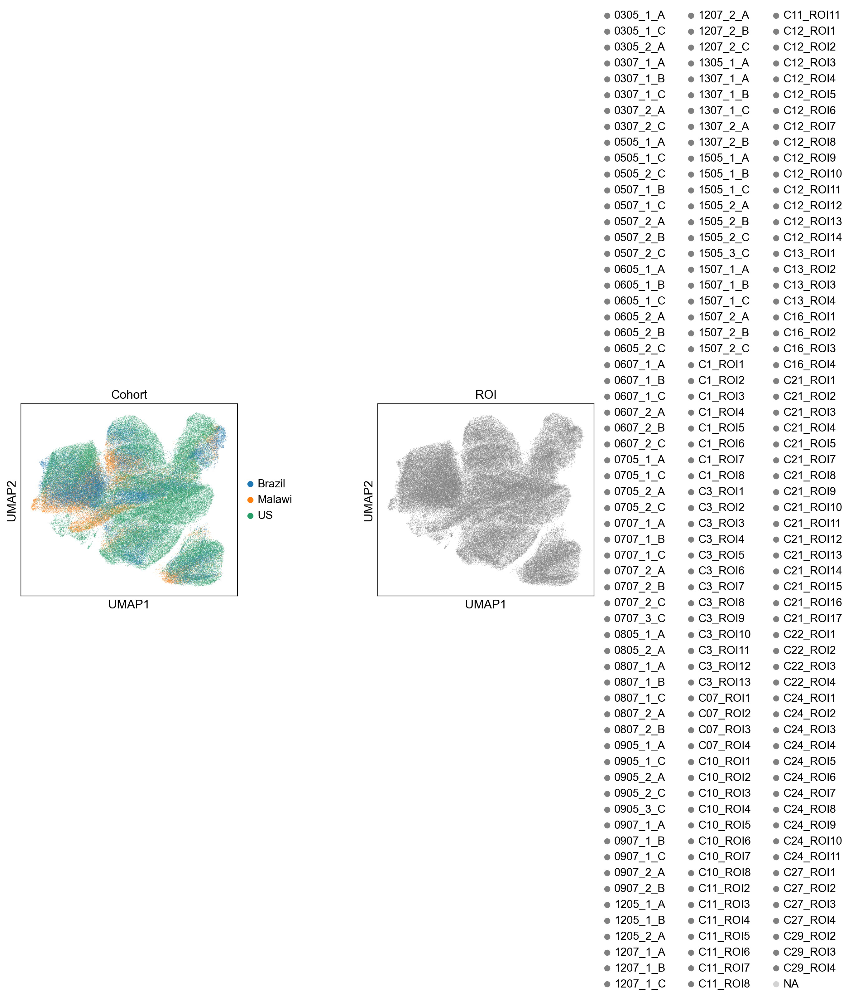

In [41]:
sc.pl.umap(adata, color = ['Cohort', 'ROI'], wspace = 0.5)

/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


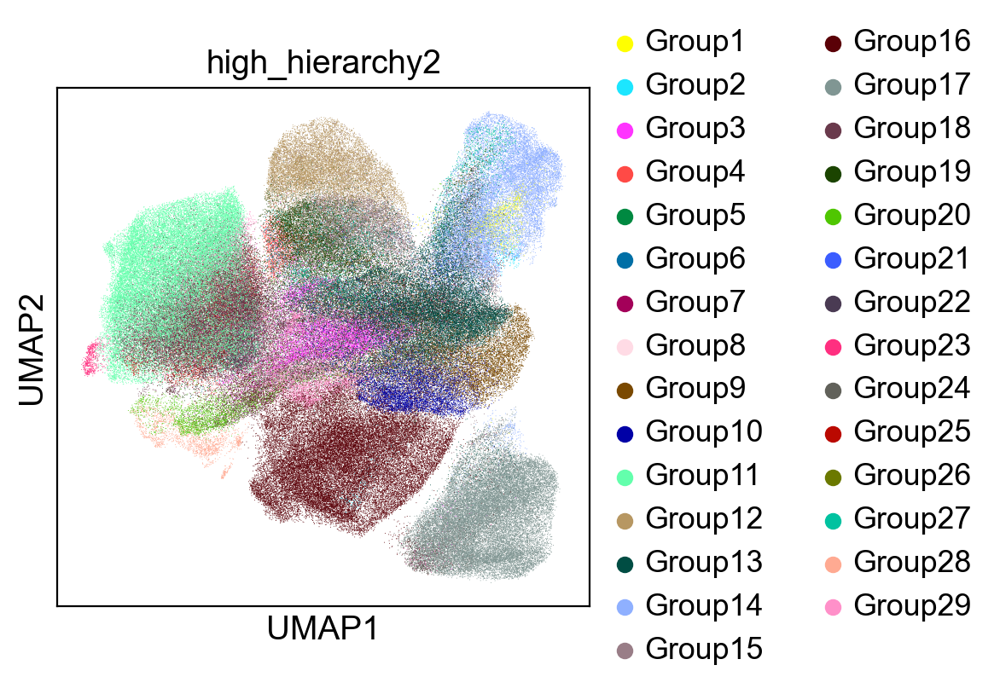

In [42]:
sc.pl.umap(adata, color = 'high_hierarchy2')

In [43]:
# Alternatively, use the donor_id rather than Dataset as the batch confounder.

cellhint.integrate(adata, 'ROI', 'high_hierarchy2')
sc.tl.umap(adata)

⚠️ The following batch(es) have too few cells (<= 10), please remove them before running `cellhint.integrate`: {'nan'}


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:52)


/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/pytho

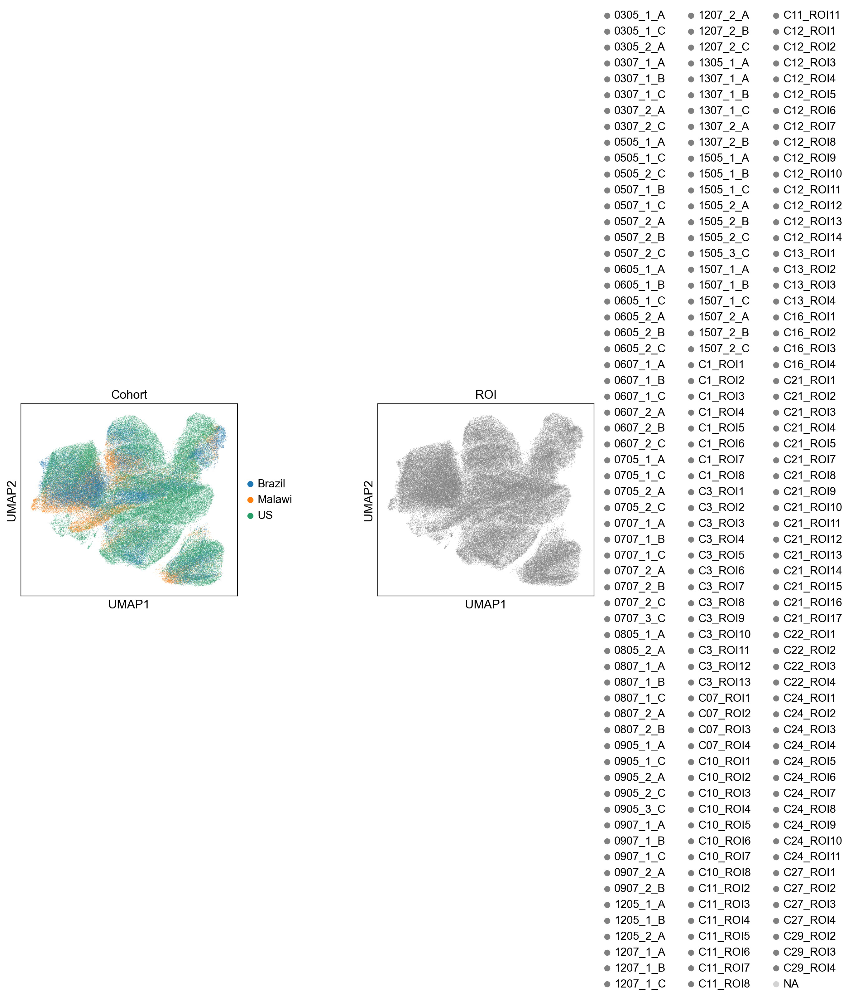

In [44]:
sc.pl.umap(adata, color = ['Cohort', 'ROI'], wspace = 0.5)

/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


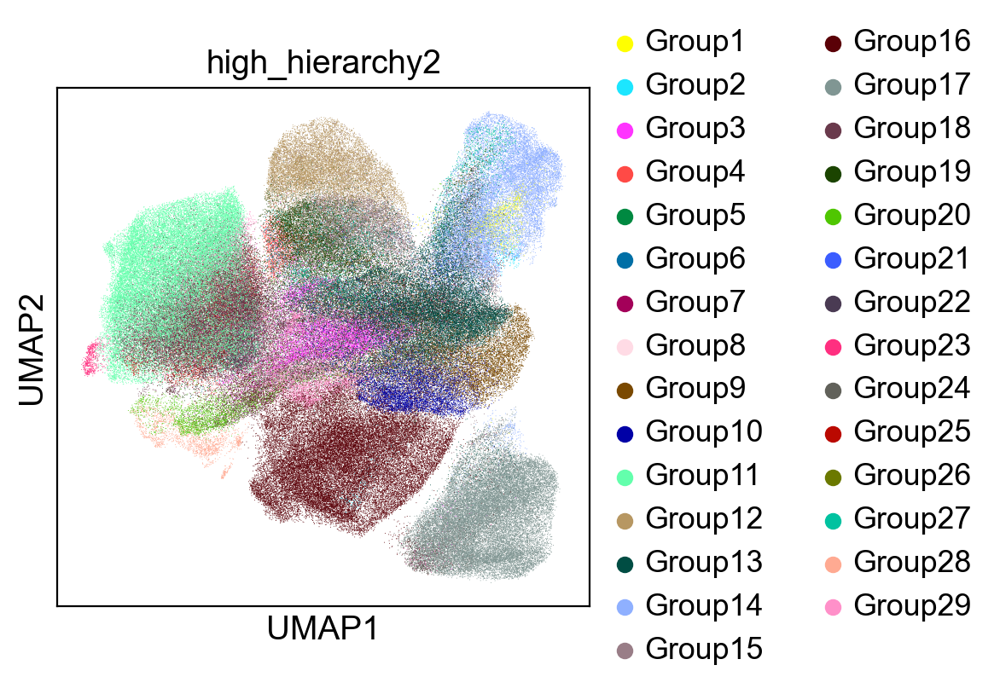

In [45]:
sc.pl.umap(adata, color = 'high_hierarchy2')

/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/pytho

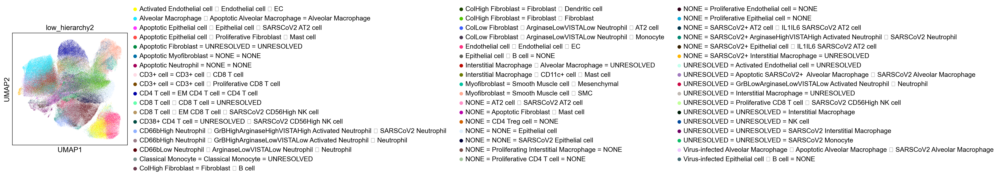

In [46]:
sc.pl.umap(adata, color = 'low_hierarchy2')

/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1208: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/Users/joaoluizsfilho/opt/anaconda3/envs/Squidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


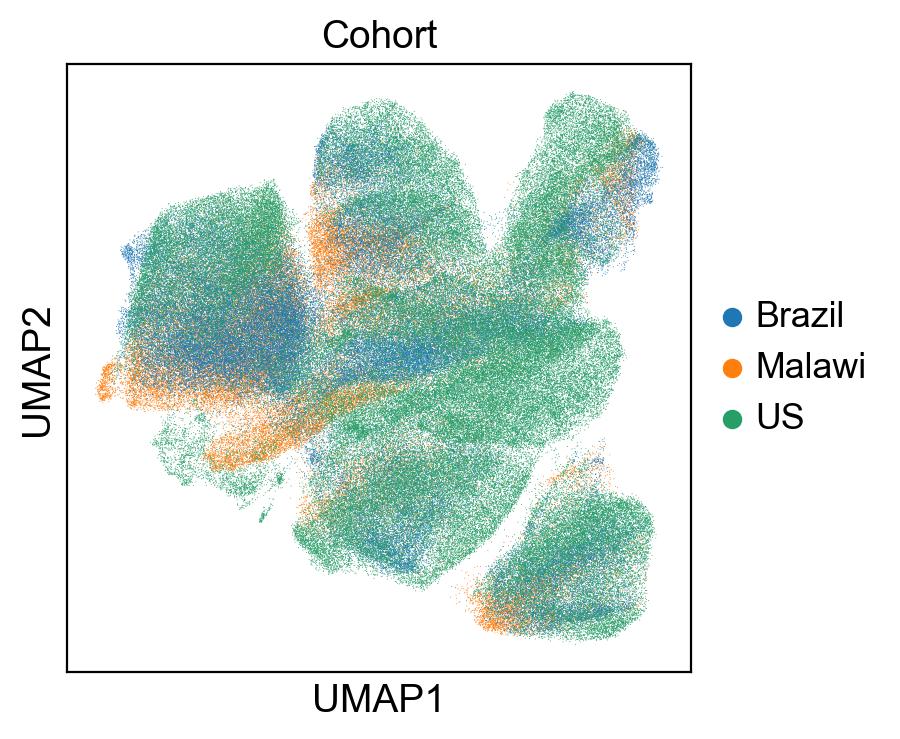

In [47]:
sc.pl.umap(adata, color = 'Cohort', save='cellhint.pdf')